<i>
Date: 18/01/2023 </br>
Name: Felix Kröber </br>
ID: e22108522 </br>
</i>

<h1> Deep Learning Assignment - Oil Palm Classification </h1>

## Instructions

For this assignment, we ask you to train a deep learning model able to detect oil palm plantation in Planet images. The aim is to train a deep learning model that is as accurate as possible for this particular binary classification task.

Task details:
* Each image has a 3 meter spatial resolution, has 3 channels (RGB) and a size of 256 $\times$ 256 pixels.
* Label `0` means there is no oil palm plantation in the image, and `1` indicates the presence of an oil palm plantation. 
* Access is given to the train set (images + labels), and independent test images. We hold out test labels to evaluate your final classification performance (average F-Score).

The dataset has been collected and modified from [Kaggle](https://www.kaggle.com/c/widsdatathon2019/data), and was proposed in the Women in Data Science Datathon 2019.

You should upload your notebook on Moodle (not a Google Drive link, but a notebook `.ipynb` or some scripts) describing your different experiments as well as csv file `testdata.csv` similar to `traindata.csv` that contains two columns: the image name and the prediction.

Your notebook plays the role of a report. It should 
* describe the different experiments you have made
* include a summary of the results you have obtained 
* analyse these results
* include the code for only the main experiments.

We will pay attention to
* the full framework that leads to the predictions
* the design of the architecture,
* the explanation about the different experiments and how you get to the final results (summarize the information and the main issues you encountered and how you solved them, highlight the salient experiments)
* the cleanliness of the code.

## General strategy & setup

Solving the given classification task is realised as follows. First, an exploratory data analysis (EDA) is conducted to obtain an overview of the data set as well as its specifics and the resulting necessary preprocessing steps. Next, a simple machine learning model is established to create a baseline for the subsequent training and evaluation of the deep neural networks, which build the focus of the current exercise. Different network architectures are trained and their hyperparameters are optimised. The models are compared using the validation dataset. Finally, the best model is selected and predictions are made using a bagging approach.

For reasons of cleanliness and readability, the current notebook only serves to demonstrate the overall workflow and summarise the main results. The definition of the different models and their training is outsourced to individual .py files. The complete set of scripts used can be found in the corresponding [github repository](https://github.com/fkroeber/oil_palm_classification).

In [1]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import rasterio as rs
import seaborn as sns
import torch
import torchmetrics as metrics
import ttach as tta
import warnings

from copy import deepcopy
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from itertools import product
from IPython.display import IFrame 
from rasterio.plot import show
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from tqdm import tqdm

from scripts.nn_models import NN
from scripts.rf_baseline import OilPalmRF
from scripts.utils import decompress_pickle, safe_copy

warnings.filterwarnings("ignore", category=rs.errors.NotGeoreferencedWarning)

c:\Users\felix\.virtualenvs\oil_palm_classification\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# reload modules after changes
%load_ext autoreload
%autoreload 2

In [3]:
# define relevant paths
# note: notebook was run locally, not on colab

data_path = "data/palm_detection"
res_path = "results"

## Explorative Data Analyses (EDA)

In [4]:
# get number of images
print(f"Number of labelled images: {len(os.listdir(os.path.join(data_path, 'train')))}")
print(f"Number of unlabelled images: {len(os.listdir(os.path.join(data_path, 'test')))}")

Number of labelled images: 7594
Number of unlabelled images: 7637


More than 7600 unlabelled images are available for testing the single best performing model. This set of images will only be used in a final step to predict labels and create the submission file `testdata.csv`. The actual training and selection of the model has to be based on the 7594 labelled images which will be explored further subsequently. At the end of this section, they will be re-split into training, validation and test images such that training, hyperparameter optimisation and model selection, and the evaluation of the proposed models becomes feasible.

In [5]:
# read info on the train data
train_df = pd.read_csv(os.path.join(data_path, "traindata.csv"))
train_df

,img_id,has_oilpalm
0,train/img_0000.jpg,0
1,train/img_0001.jpg,0
2,train/img_0002.jpg,0
3,train/img_0003.jpg,0
4,train/img_0004.jpg,0
...,...,...
7589,train/img_7589.jpg,0
7590,train/img_7590.jpg,1
7591,train/img_7591.jpg,0
7592,train/img_7592.jpg,0


The ``img_id`` column indicates the relative path to the image and the ``has_oilpalm`` columns give the corresponding class index (i.e. label). As checked below, labels are given for all images and no missing data points are encountered.

In [6]:
# check for NAs
train_df.isna().sum()

img_id         0
has_oilpalm    0
dtype: int64

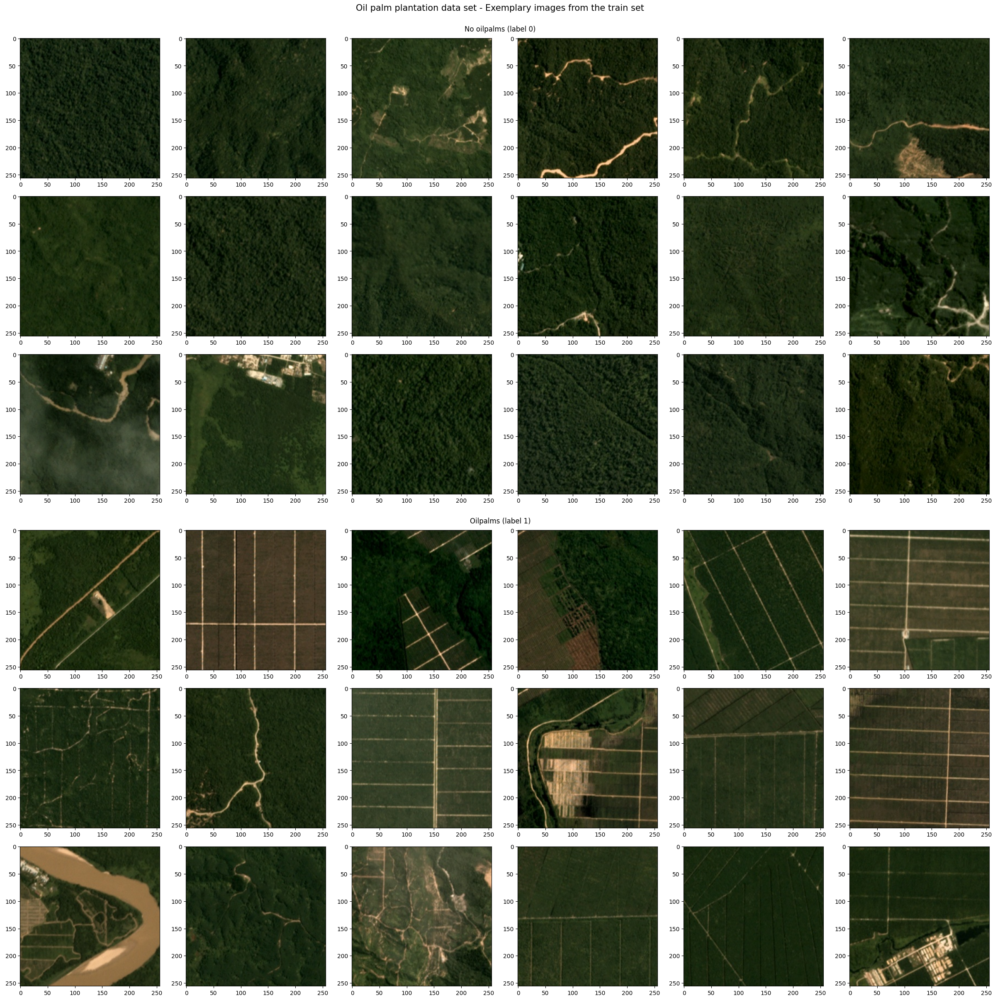

In [7]:
# print some images
# select specified number of samples randomly
n_examples = 18
train_vis = train_df.groupby("has_oilpalm").sample(n_examples, random_state=42)
no_oil_palms = train_vis[train_vis["has_oilpalm"] == 0]
oil_palms = train_vis[train_vis["has_oilpalm"] == 1]

# plot grid configuration
n_cols = 6
n_rows = int(np.ceil(n_examples/n_cols))

# figure creation
fig, ax = plt.subplots(figsize=(24, 8*n_rows), constrained_layout=True)
ax.set_axis_off()
fig.suptitle("Oil palm plantation data set - Exemplary images from the train set\n", fontsize=15)
subfigs = fig.subfigures(nrows = 2)

subfigs[0].suptitle("No oilpalms (label 0)")
axs = subfigs[0].subplots(nrows=n_rows, ncols=n_cols)
for i, ax in enumerate(axs.flat):
    if i < n_examples:
        img = rs.open(os.path.join(data_path, no_oil_palms.iloc[i,0])).read()
        show(img, ax=axs.flat[i])
    else:
        axs.flat[i].set_axis_off()

subfigs[1].suptitle("Oilpalms (label 1)")
axs = subfigs[1].subplots(nrows=n_rows, ncols=n_cols)
for i, ax in enumerate(axs.flat):
    if i < n_examples:
        img = rs.open(os.path.join(data_path, oil_palms.iloc[i,0])).read()
        show(img, ax=axs.flat[i])
    else:
        axs.flat[i].set_axis_off();

Visualising some exemplary images points to the differentiability of both classes based on structural and contextual image features. For images, which are labelled as containing oil palms, regular grid structures indicating pathways and/or management patterns are often visible. Spectral information seems to be less discriminating since images from both classes tend to be covered by trees that appear in similar greenish colors. Only in some cases - presumably due to recent clearing, for example - are the images labelled as oil palm more strongly characterised by brown shades indicating bare soil. 

Since the differences between the two classes are in most cases easily recognisable to the human eye, the classification task can generally be considered simple and high accuracies can be expected. However, when screening larger parts of the data set, it also becomes clear that there are some cases where the distinction is not as easy since some images labelled as containing oil palms do not exhibit grid structures at all.

In [8]:
# assess class imbalance
label_freq = train_df.value_counts("has_oilpalm")
print(f"Proportion of images with oil palm plantations: {label_freq[1]/label_freq.sum():.2%}")

Proportion of images with oil palm plantations: 12.43%


Considering the given class imbalance with only a minor proportion of all images being classified as oil palm plantations, dedicated steps are required to avoid that a learning algorithm simply predicts the majority label everywhere and achieves high accuracies with this strategy ([He & Garcia 2009](#references), [Krawezyk 2016](#references)). In general there are several options to handle class imbalances and they may be categorised as follows:  
* data level methods: methods that modify the data as input to the classifier (e.g. random undersampling & oversampling, SMOTE, etc.)
* training level methods: cost-sensitive learning with adjustments made to the loss during training to focus on the minority class (e.g. re-weighting, focal loss)
* evaluation level methods: no tackling of the actual class imbalance problem for training the models, instead usage of evaluation methods which enable a class-differentiated depiction of the performance (e.g. confusion matrices) or metrics which aggregate different accuracies for different classes in a meaningful way (e.g. F1-score)

In the following, mainly a data level method, namely random oversampling, will be applied. This renders the need to pay attention to the class imbalance problem when training the various models - as given in the case of training level methods - obsolete. Compared to undersampling, which reduces the amount of training samples to twice the size of the minority class and thus discards significant information for training, oversampling keeps all images and adds replicates from the minority class. As shown by [Buda et al. 2018](#references), specifically for convolutional neural networks (CNNs) oversampling is preferable compared to undersampling. One reason for this is that overfitting, which is a commonly mentioned risk of oversampling, doesn't seem to appear for CNNs as opposed to classical machine learning models when applying this resampling technique. Thus, random oversampling is considered a simple yet effective measure in the given case. Note that random oversampling is only applied to the training data, neither the validation nor test set. This ensures that the accuracy metrics for the validation and test set are reliable estimates of the models predictive power in production mode assuming that the real-world data set on which the model is used later on is also imbalanced and its label distribution is similar to that of the training data. 

In [9]:
# seperate train-val-test
X = np.array(train_df["img_id"]).reshape(-1,1) 
y = np.array(train_df["has_oilpalm"]).reshape(-1,1)

X_, X_test, y_, y_test = train_test_split(X, y, stratify=y, test_size=0.20, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_, y_, stratify=y_, test_size=0.25, random_state=42)

# oversample train set
ros = RandomOverSampler(random_state=42)
X_train, y_train = ros.fit_resample(X_train, y_train)
X_train, y_train = X_train.reshape(-1,1), y_train.reshape(-1,1)

# print proportions
print(f"Number of images: [no oil plam, oil palm]")
print(f"Train set: {np.unique(y_train, return_counts=True)[1]}")
print(f"Val set: {np.unique(y_val, return_counts=True)[1]}")
print(f"Test set: {np.unique(y_test, return_counts=True)[1]}")

Number of images: [no oil plam, oil palm]
Train set: [3990 3990]
Val set: [1330  189]
Test set: [1330  189]


## Baseline model: Random Forest

### Motivation

In the next step, a simple random forest (RF) classifier is trained and evaluated as an established machine learning algorithm. It is already clear in advance that the CNNs and vision transformers as deep learning methods adapted to vision tasks should outperform simple machine learners. The following brief consideration of an RF model is nevertheless considered useful for the following three reasons:

* If the accuracies achieved by means of neural networks (NNs) do not significantly exceed those of the RF, this indicates fundamental errors in the model configuration or the model training. The RF thus represents a quickly trainable algorithm to define an expected lower bound of the accuracy.

* The fast trainability of the RF compared to deep learning methods enables an efficient exploration of the statistical reliability or variability of the results. This concerns the variability of the results of the hyperparameter tuning as well as the test accuracy depending on the specific train-val-test split. The analysis of the existing uncertainties is essential in order to design a meaningful training design of the NNs with cross-validation, if necessary, and ultimately to be able to make reliable statements on the performance of the models.   

* For reasons of sustainability as well as fundamental principles of scientific work (Ockham's razor), it is generally recommended to choose the simplest model that is suitable for solving the given task. Even though in this case the focus is explicitly on maximising accuracy and thus naturally on deep learning methods, it should nevertheless be briefly evaluated whether less complex, more resource-efficient machine learners can solve the task with an acceptable loss of accuracy.

### Feature engineering

There are many possibilities for extracting and describing meaningful image features in the manual feature engineering step that precedes the RF training. The sets of features that are specifically considered here are briefly described below:

* First, the scale-invariant feature transform (SIFT) is used to calculate keypoints and characterise them via histograms of oriented gradients (HOGs). SIFT is generally used for aligning images but due to the feature descriptor HOG also useful for characterising texture in images, which, in turn, was identified as a relevant characteristic in the above EDA. SIFT proved to be more powerful for classifications of remote sensing images than alternative texture-focused methods such as local binary patterns (LBPs) ([Cheng et al. 2017](#References)). Other advantageous properties of SIFT in the given context are that the method is robust against scale, rotation, and illumination conditions.

* Secondly, lines are extracted from the images using the hough transform to capture characteristic management patterns in the case of oil palm plantations. The number and average length of the lines per image are subsequently considered as input features for the RF.

* Thirdly, segmentation is performed and the area and mean spectral value per band of all segments per image are included in the set of RF features. While the two aforementioned feature sets emphasise specific textural and geometric properties of the scenes, the inclusion of properties of the segments as RF-features is in the sense of a holistic spatial and spectral characterisation of the individual scenes. Felszenswalb segmentation is used as an efficient graph-based segmentation algorithm. 

Note that in the case of SIFT as well as the segments, 2D arrays with varying dimensions per scene are the output. For the SIFT features, the dimensionality of the feature array for a given scene corresponds to (<i>n_keypoints</i>, <i>128</i>) and for the segments to (<i>n_segments</i>, <i>4</i>). To reduce and normalise the dimensionality of these features, a bag of visual words approach is used in both cases. The bag of visual words can be considered as a sparse 1D vector of occurrence counts of a vocabulary of image features. To convert the 2D arrays into this 1D information, k-means clustering is used to extract the visual codewords that constitute the vocabulary. Then, each keypoint in the case of SIFT or each segment in the case of segmentation is assigned to its nearest cluster centroid, so that a mapping to the codewords represented by the cluster centroids takes place. A histogram across the codewords then forms the resulting bag of visual words. The optimal number of cluster centres or codewords is subsequently handled as a hyperparameter.

### Model training & evaluation

Nested cross-validation is applied for hyperparameter tuning and model evaluation. To reduce the complexity of the tests, only the above-mentioned number of cluster centres for the bags of visual words are considered as hyperparameters. For each of the two bags (one for SIFT and one for segments) 5 different values between 4 and 20 are assessed by 4-fold cross-validation. This represents the inner loop of cross-validation, whereas the outer loop of cross-validation is made up by repeating this procedure 5 times for different train-test splits. This aims at measuring the variability of the test accuracy.

In [10]:
# instantiate rf object
rf = OilPalmRF([os.path.join(data_path,x) for x in train_df["img_id"]], train_df["has_oilpalm"])

# feature extraction & model training  
# rf.feat_engineering(save_path = os.path.join(res_path, "rf", "feat_engineering.pbz2"))
# rf.train_eval_model(save_path = os.path.join(res_path, "rf", "results.pbz2"))

# re-read results from disk below
rf.feat_eng_res = decompress_pickle(os.path.join(res_path, "rf", "feat_engineering.pbz2"))
rf.mod_res = decompress_pickle(os.path.join(res_path, "rf", "results.pbz2"))

# print results
rf.mod_res

,BoW_k_sift,BoW_k_segments,test_split,split_0,split_1,split_2,split_3,val_acc_mean,val_acc_std,test_acc
0,4,4,0,0.922976,0.922976,0.917051,0.920290,0.920823,0.002438,0.921001
1,4,4,1,0.916392,0.921001,0.911784,0.916337,0.916379,0.003259,0.914417
2,4,4,2,0.906517,0.900592,0.919026,0.918314,0.911112,0.007846,0.926926
3,4,4,3,0.911784,0.924292,0.907834,0.915020,0.914733,0.006078,0.922976
4,4,4,4,0.913101,0.928901,0.912442,0.920290,0.918683,0.006654,0.919684
...,...,...,...,...,...,...,...,...,...,...
120,20,20,0,0.925609,0.922976,0.914417,0.914361,0.919341,0.005038,0.919684
121,20,20,1,0.923634,0.917709,0.915076,0.917655,0.918518,0.003139,0.916392
122,20,20,2,0.911784,0.905201,0.929559,0.921607,0.917038,0.009292,0.927584
123,20,20,3,0.919684,0.932192,0.907176,0.914361,0.918353,0.009140,0.921001


In [11]:
# aggregate results over different train-test splits - mean
rf_agg_mean = rf.mod_res.groupby(["BoW_k_sift", "BoW_k_segments"]).mean()
rf_agg_mean = rf_agg_mean.sort_values("val_acc_mean", ascending=False).reset_index()
rf_agg_mean.head()

,BoW_k_sift,BoW_k_segments,test_split,split_0,split_1,split_2,split_3,val_acc_mean,val_acc_std,test_acc
0,10,8,2.0,0.921001,0.923897,0.918762,0.920817,0.921119,0.007157,0.923371
1,10,10,2.0,0.921659,0.923634,0.917841,0.919895,0.920757,0.006886,0.923239
2,10,20,2.0,0.920342,0.923897,0.918104,0.920422,0.920691,0.006422,0.922712
3,10,6,2.0,0.920606,0.923634,0.917709,0.920422,0.920593,0.007039,0.924161
4,10,4,2.0,0.920737,0.922054,0.917972,0.920949,0.920428,0.006781,0.923107


The classical RF model achieves a test accuracy of 92.3% (for the best hyperparameter combination based on validation accuracy). Note that the 92.3% was measured as the overall accuracy on the unbalanced test data set. The value is about 4.7% above the expected value for a naive classifier that consistently predicts the majority label. This shows that the model has indeed learned relevant features to discriminate between images with and without oil palms.

In [12]:
# aggregate results over different train-test splits - std
rf_agg_std = rf.mod_res.groupby(["BoW_k_sift", "BoW_k_segments"]).std()

print(f"Mean validation accuracy std for different train-test splits: {rf_agg_std['val_acc_mean'].mean():.2%}.")
print(f"Mean test accuracy std for different train-test splits: {rf_agg_std['test_acc'].mean():.2%}.")

Mean validation accuracy std for different train-test splits: 0.22%.
Mean test accuracy std for different train-test splits: 0.57%.


Taking a look at the variability of results, it becomes apparent that variations of accuracies of >0.5% are likely to occur for different train-val-test splits. The figures printed above show the variability for 5 different train-test splits averaged across all tested hyperparameter configurations. For the corresponding figures tailored to the effect of different train-val splits, one has to consider the aggregated standard deviation of validation accuracies `val_acc_std` as shown in the two tables before.

For all further analyses this observation implies that giving reliable estimates on a models performance with precisions better than 0.5% may require to re-run analyses for several train-val-test splits, i.e performing cross validation. It should be noted that the figures calculated above to quantify the inaccuracies are of course not only data-dependent, but above all model-dependent. Accordingly, they cannot be directly transferred as expected values to the uncertainties of the NNs discussed below. It should also be noted that the figures represent simple aggregated values and thus do not necessarily say anything about whether, for example, several train-test splits are actually required for the comparison of two models relative to each other. Without further breaking down the results in this way, the repetition of the training for 3 different train-val-test splits is set as the basic setup for subsequent NN training. 

## Deep learning models: CNNs & Vision transformer


### Prepare data for NN training

As decided above, NNs should be trained and evaluated on multiple train-val-test splits in order to limit the selection bias and enable a reliable identification of the best performing model. Also corresponding oversampling of the train set should take place for each split. To realise this setup with multiple splits, there are two possibilities:
* prepare several splits by replicating data actually on the hard drive
* modifying the dataloader - specifically creating a custom dataset and using pytorch's WeightedRandomSampler 

Generally, and especially in case of large datasets, the second option is preferred. However, in the given case due to small dataset size - with oversampling a set of train-val-test is still smaller than 250Mb - the first option is chosen in favour of the usability of the `train_nn*.py` scripts. The latter are created as generic wrappers for training and evaluating models on a classification task. Their data loading part is based on the predefined pytorch class ImageFolder, which enables to run the script on any dataset that adheres to the common folder structure. Apart from this consideration, performing the splitting and resampling of the images upfront separates this pre-processing step clearly from the subsequent sections of the model training and evaluation.

In [13]:
def split_data_into_folders(split_folder, seed):
    # load image paths & labels
    X = np.array(train_df["img_id"]).reshape(-1,1) 
    y = np.array(train_df["has_oilpalm"]).reshape(-1,1)
    # seperate train-val-test
    X_, X_test, y_, y_test = train_test_split(X, y, stratify=y, test_size=0.20, random_state=seed)
    X_train, X_val, y_train, y_val = train_test_split(X_, y_, stratify=y_, test_size=0.25, random_state=seed)
    # oversample train set
    ros = RandomOverSampler(random_state=seed)
    X_train, y_train = ros.fit_resample(X_train, y_train)
    X_train, y_train = X_train.reshape(-1,1), y_train.reshape(-1,1)
    ds = {
        "train": [X_train, y_train],
        "val": [X_val, y_val],
        "test": [X_test, y_test],
        }
    # split data into folders
    for set, (imgs, labels) in ds.items():
        for img,label in zip(imgs, labels):
            src_path = os.path.join(data_path, str(img[0]))
            dest_folder = os.path.join(split_folder, set, str(label[0]))
            os.makedirs(dest_folder, exist_ok=True)
            safe_copy(src_path, dest_folder)

# for seed in tqdm(np.arange(3)):
#     split_data_into_folders(os.path.join(data_path, "resampled", f"split_{seed}"), seed)

### Broad-scale hyperparameter search 

To derive at the most accurate model in a time-efficient manner, hyperparameter search is split into two parts: a preliminary broad-scale exploration of hyperparameters in a grid search manner and a subsequent fine-grained bayesian hyperparameter optimisation for the most promising networks and settings explored in the preceding step. For the current broad-scale search the emphasis is put on exploring a wide range of network structures using some common settings for learning rates and optimisers. The selection of the tested networks restricts itself to state-of-the-art model architectures. Early network architectures such as LeNet, AlexNet and VGG, which are known to be inferior to the more recent networks in terms of accuracy and/or training speed are omitted in the first place. To increase the diversity among the explored architectures not only CNNs but also vision transformers are explored. Each of the 8 models tested is briefly described below.

CNNs

* DenseNet: Architecture that connects all layers in a feed-forward fashion, allowing feature reuse and reducing the number of parameters. Each layer receives the feature maps of all preceding layers as inputs and passes its own feature maps to all subsequent layers. This improves the flow of information through the network and enables the network to learn more efficiently by making use of residual mechanisms (see Resnet).

* Inception: Architecture that uses a combination of filters of different sizes in the same block being concatenated subsequently. This allows the network to capture information at different scales. For efficiency, 1x1 convolutions are used and convolutions are factorised (i.e. a 3x3 convolution is replaced by a 3x1 followed by 1x3 convolution), both of which reduces the number of parameters.

* ResNet: Architecture that uses residual connections, adding the input of a layer to the output in form of an identity mapping. This allows the network to learn the residual mapping instead of the original mapping, which makes the training of very deep networks possible as it alleviates the vanishing gradient problem. Additionally, the residual connections lead to favouring simpler solutions to a given problem. 

* ResNext: Extension of the ResNet architecture that uses grouped convolutions, i.e. multiple filter groups with each of the kernels in a given group being convolved only with a small portion of the previous layer's feature maps. The idea originated in AlexNet mainly out of model and data parallelism reasons. However, it is also improving the representational power of the network as sparse filter relations with low correlation between kernel filters of different filter groups are learned.

* WideResNet: Extension of the ResNet architecture that utilises width scaling, i.e. increasing the number of filters in each layer.This allows for a larger context modeling with fewer parameters and improves the representational power of the network.

* SeNet: Architecture that uses squeeze-and-excitation (SE) blocks to adaptively recalibrate channel-wise feature responses. This improves the model's ability to focus on important features and omitting less useful ones.

Vision Transformers

* MaxVit: Extension of the classical vision transformer idea that consists of patch embedding, feature extraction via encoders and a classification head. Multi-axis vision transformer introduce max pooling operations to this in order to reduce the spatial dimension of the input feature maps, allowing for larger context modeling with fewer parameters.

* SwinVit: Hierarchical vision transformer using shifted windows with the mechanism of self-attention in windows to weight the features with a windowed attention mechanism, allowing for more fine-grained feature modeling.

For all models, their weights are initialised with the available states from ImageNet training in order to benefit from transfer learning. Finetuning with updating all layers' weights during training is preferred over feature extraction, for which one would keep the weights of the pre-trained core fixed. The latter is considered insufficient to enable the necessary adjustments to be made, given the significant differences between the ImageNet dataset and the current dataset.

Two different standard choices for learning rates (0.001 & 0.0001) are combined with two choices for optimisers (Adam, SGD) to test 4 hyperparameter configurations for each architecture. All trainings are repeated for each of the previously created train-validation-test splits 3 times to investigate the stochastic nature of the training process (i.e. random initialisation of last layer's parameters, mini-batch training, etc.). Model training is done with early stopping on the validation set to prevent overfitting and minimise the total training time. The maximum number of epochs is set to 50.

In terms of data augmentation, simple geometric transforms are applied equally for training all models. Indisputably applicable augmentation strategies, which should result in the same class assignments, are assumed to be random horizontal and vertical flips. Other transforms, by contrast, would need to be explored in detail regarding their potential benefit in terms of data augmentation and increasing model robustness. Some of them may even hurt the model performance. As quite a few plantations only cover certain parts of the image, applying a random crop, for example, is not as straightforward as the flipping images.

The main results of the training can be investigated below in an interactive manner. Note that due to the large number of total runs (i.e. 8 x 4 x 3 x 3 = 288) not all aspects of the training processes can be depicted in detail. To allow a concise but meaningful investigation of the results, the following summaries are provided:
* tabular summary of runs sorted according to the validation accuracy achieved at the early stopping point (<i>best_acc_val</i>) -> allows analyse individual model runs or groups of model runs
* scatterplot of runs grouped by hyperparameter configuration showing their average training time per epoch and best validation accuracy -> gives a quick overview on the main characteristics relevant for narrowing down the choice of models for the subsequent fine-grained hyperparameter search
* scatterplot of validation and test accuracy grouped by hyperparameter configuration -> sanity check to see if there is a correlation between validation and test accuracies and, thus, if the performed hyperparameter search is reasonable

In [239]:
# see hyperparameter_search_I.py & nn_train.py in github repo for src code

# render report
url = "https://api.wandb.ai/report/fkroeber/k1jiodg0"
IFrame(url, width=950, height=800)

### Detailed hyperparameter search

While the previously applied grid search can be considered a good choice to gain first insights into model behaviours and to compare models by keeping on setting fixed and varying the others, it is known that other hyperparameter search strategies such as random search and bayesian optimisation are more efficient ([Yang & Shami 2020](#references), [Yu & Zhu 2020](#references)). Bayesian hyperparameter search performs an informed search by accumulating evidence for potentially well-suited hyperparameters based on previously tested ones. To this end, a surrogate model such as a Gaussian Process is used to model the objective of accuracy as a function of hyperparameters. Choices for next hyperparameters to be assessed are then based on the expected improvement which can be calculated from the surrogate model. In the following, the WandB implementation of bayesian hyperparameter optimisation will be used.

The following hyperparameters are tested: 
* net architecture - ResNext, SeNet or SwinVit
* lr - uniform distribution in [5e-5, 1e-3] 
* lr_speed_core - uniform distribution in [0.01, 1] 
* optimisers - Adam, SGD 
* loss - binary cross entropy (BCE), hinge or squared hinge 

Note that compared to the previous analyses, two further hyperparameters are included in the search: 
* Until now, only cross entropy as a standard choice for classification problems has been considered. In the next step, hinge loss and squared hinge loss as alternatives known for obtaining good results in classification problems ([Janocha & Czarnecki 2017](#references)) will be assessed as well. The main difference between hinge losses and cross entropy is that the former penalize predictions also when they are correct but not confident. The aim of hinge losses is to maximise the margin between the decision boundary and the data points.
* lr_speed_core refers to the learning rate for all weights of the pretrained backbone of the network relative to the learnin rate used in the last classification layer. This parameter is introduced to better control the balance between finetuning and feature extraction. For small values, the pretrained weights of the backbones are adjusted less, so that the model acts more as a feature extractor. The parameter is taken into account in particular to prevent the weights of the pretrained backbone from being changed too much in the first epochs and thus the transferred knowledge from being lost. 

Note that the batch size is not among the tested hyperparameters but among the set of fixed parameters. It is set to 64 (as before) in order to maximise the GPU utilisation. Even though it is commonly said to be a significant hyperparameter, fixing it shouldn't harm the accuracy as long as the learning rate is adjustable and tuned correspondingly. While the original view was that especially small batch sizes have favourable convergence properties due to the inherent noise in the gradient calculation ([Keshar et al. 2016](#references)), subsequent works have shown that the decisive factor is not so much the batch size but its relation to the learning rate ([Hoffer et al. 2017](#references)). Keeping the batch size fixed while varying the learning rate is also in line with the recommendations issued by [Smith 2018](#references). 

Some further side notes to adequately represent all changes compared to the previous experiments:
* Along with the testing of several loss functions, slight modifications are made to the network architecture in the final layer. While up to now two output neurons were used to output the probabilities for both classes separately, for all subsequent analyses only one output neuron is used to make the binary decision. While the first option of setting the number of output neurons according to the number of classes with a subsequent softmax function to obtain probabilities can be understood as a generic solution to a classification problem, the latter option allows some parameters to be saved in the special case of binary classification. However, this is more of a technical side note.  
* The augmentation strategy is enriched by including rotations (angles of {0, 90, 180, 270}). This augmentation strategy was simply forgotten in the grid search above.

The bayesian hyperparameter optimisation is run on the 3 train-val-test splits with a maximum of 50 configurations being tested for each of them. The results are again displayed in an interactive manner below.

In [240]:
# see hyperparameter_search_II.py & nn_train_II.py in github repo for src code

# render report
url = "https://api.wandb.ai/report/fkroeber/muj14cc7"
IFrame(url, width=950, height=800)

### Final model tuning & evaluation

The best possible configuration of parameters found in the two-step process of hyperparameter search was used to train the final model for all three train-val-test splits. Note that the loss curves for the validation and test set are fluctuating strongly. For possible rationales and further considerations, see the previous section.

In [241]:
# see final_model_training.py & nn_train_II.py in github repo for src code

# render report
url = "https://api.wandb.ai/report/fkroeber/4giex7fc"
IFrame(url, width=950, height=800)

Prior to model evaluation, this section will first examine one last possibility for optimising the performance of the model, namely test time augmentation (tta). This involves applying random modifications to the test images at inference time and forming the final prediction as an average of the individual predictions. Two different forms of augmentation will be evaluated based on their impact on the accuracy of the validation data.

In [14]:
def assess_tta(trained_mod_path, tta_transforms):
    # get models config
    config_df = pd.read_csv(os.path.join(trained_mod_path, "model_config.csv"), header=None)
    config_dict = dict(zip(config_df.iloc[:,0], config_df.iloc[:,1]))

    # init model & transforms
    model_kwargs = {
        "model_name": config_dict["model_name"],
        "mode": config_dict["train_mode"],
        "num_classes": 1,
        "seed": int(config_dict["seed"]),
    }
    model_ft, model_transform = NN(**model_kwargs).init_model()

    # prepare data to be loaded
    image_datasets = {
        x: datasets.ImageFolder(os.path.join(config_dict["data_dir"], x), model_transform)
        for x in ["train", "val", "test"]
    }
    loader_args = {
        "batch_size": int(config_dict["batch_size"]),
        "shuffle": False,
        "num_workers": 4,
    }
    dataloaders = {
        x: DataLoader(image_datasets[x], **loader_args)
        for x in ["val", "test"]
    }

    # check GPU availability
    device = torch.device("cuda:0") if torch.cuda.is_available() else "cpu"
    model_ft = model_ft.to(device)

    # initalise accuracy metrics
    metric_collection = metrics.MetricCollection(
        [
            metrics.classification.BinaryAccuracy(),
            metrics.classification.BinaryF1Score(),
            metrics.classification.BinaryPrecision(),
            metrics.classification.BinaryRecall(),
        ]
    )
    acc_metrics = metric_collection.to(device)

    # prepare model 
    params_path = os.path.join(trained_mod_path, "model_params.pt")
    model_ft.load_state_dict(torch.load(params_path))

    # evaluate model on dataset
    res = {}
    model_ft.eval()
    for mode in ["plain", "tta"]:
        for phase in ["val", "test"]:
            # containers for individual paths, predictions, labels
            single_res = {"paths": [], "preds": [], "labels": []}
            # iterate over data
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device, dtype=torch.float)
                labels = labels.to(device, dtype=torch.float)
                with torch.set_grad_enabled(False):
                    if mode == "plain":
                        outputs = model_ft(inputs).view(-1)
                    elif mode == "tta":
                        model_tta = tta.ClassificationTTAWrapper(model_ft, tta_transforms)
                        outputs = model_tta(inputs).view(-1)
                    preds = torch.round(torch.sigmoid(outputs))
                acc_metrics.update(preds, labels)
                single_res["paths"] = paths = [x[0] for x in dataloaders[phase].dataset.imgs]
                single_res["preds"].append(preds.cpu().numpy().astype("int"))
                single_res["labels"].append(labels.cpu().numpy().astype("int"))
            # calculate metrics on all batches
            accs = acc_metrics.compute()
            accs = {i: k.item() for i, k in accs.items()}
            acc_metrics.reset()
            # append together with individual predictions & labels to output
            single_res["preds"] = np.concatenate(single_res["preds"]) 
            single_res["labels"] = np.concatenate(single_res["labels"]) 
            res[f"{phase}_{mode}"] = {**accs, **single_res}
    return pd.DataFrame(res)

# initialise test-time augmentation transforms
ttas = {
    "simple-augment": 
        tta.Compose(
        [
            tta.HorizontalFlip(),
            tta.VerticalFlip(),
        ]
        ), 
    "advanced-augment": tta.Compose(
        [
            tta.FiveCrops(128, 128),
            tta.Rotate90(angles=[0, 90, 180, 270]),
        ]
        )
    }       

# get configuration of best trained model
# model training via final_model_training.py
mod_paths = [
    os.path.join(res_path, "nn", "senet_split_0", "senet_Hinge_squared_Adam_0.0005"),
    os.path.join(res_path, "nn", "senet_split_1", "senet_Hinge_squared_Adam_0.0005"),
    os.path.join(res_path, "nn", "senet_split_2", "senet_Hinge_squared_Adam_0.0005"),
    ]

# assess models & ttas
ls = []
for tta_name, mod_path in tqdm(list(product(ttas, mod_paths))):
    tta_res = assess_tta(mod_path, ttas[tta_name])
    tta_res.insert(0, "tta", tta_name)
    tta_res.insert(0, "mod_paths", mod_path)
    ls.append(tta_res)

100%|██████████| 6/6 [08:36<00:00, 86.11s/it]


In [15]:
# assess accuracy gain with tta 
acc_res = pd.concat(ls).loc[['BinaryAccuracy', 'BinaryF1Score']]
acc_res = acc_res.reset_index(names="metric")
acc_res["tta_boost"] = acc_res["val_tta"] - acc_res["val_plain"]
acc_res = acc_res.infer_objects()

print("Resulting accuracy gain for test time augmentation")
acc_res.groupby(["tta", "metric"]).mean(numeric_only=True)["tta_boost"]

Resulting accuracy gain for test time augmentation


tta               metric        
advanced-augment  BinaryAccuracy   -0.001097
                  BinaryF1Score    -0.009165
simple-augment    BinaryAccuracy    0.002853
                  BinaryF1Score     0.010883
Name: tta_boost, dtype: float64

It is evident that the simple form of tta consisting of horizontal and vertical flipping improves the validation set accuracy both in terms of overall accuracy and F1-score. The advanced form of tta using cropped versions of the input images, on the other hand, tend to decrease models performances. This is somehow in line with the considerations made when discussing training data augmentation earlier assuming that cropping may be misleading as oil palm plantations are sometimes covering only small portions of the input images. Consequently, the simple form of tta will be applied subsequently when reporting the final metrics on the test set and when using the model in inference mode to predict the labels for submission .csv file. 

Note that the chosen evaluation metrics also include precision, recall and F1-score and, thus, metrics that take class imbalances into account. This means that it is also possible to make reliable statements about the models performance in use cases with a different distribution of labels.

In [16]:
# print test accuracies
acc_res = pd.concat(ls).loc[['BinaryAccuracy', 'BinaryF1Score', 'BinaryPrecision', 'BinaryRecall']]
acc_res = acc_res[acc_res["tta"] == "simple-augment"][["mod_paths", "test_tta"]]

print("Test set:\nMean accuracies & standard deviation across 3 train-val-test splits")
acc_res.groupby(acc_res.index).agg({"test_tta": ["mean", "std"]}).round(4)

Test set:
Mean accuracies & standard deviation across 3 train-val-test splits


test_tta        
                    mean     std
BinaryAccuracy    0.9399  0.0061
BinaryF1Score     0.7716  0.0231
BinaryPrecision   0.7325  0.0294
BinaryRecall      0.8166  0.0431

The final model reaches an overall accuracy of almost 94%. The F1-score reflecting the class imbalance in a more appropriate manner reaches 0.77. The lower precision relative to recall indicates that more false-negatives are predicted than false-positives. This can be confirmed by means of a confusion matrix below. 

As indicated by the standard deviation, large differences between accuracies for different train-val-test splits exist in case of precision and recall rather than the overall accuracy. Still, even for the summarising figures of overall accuracy and F1-score the attached uncertainty is considerable.

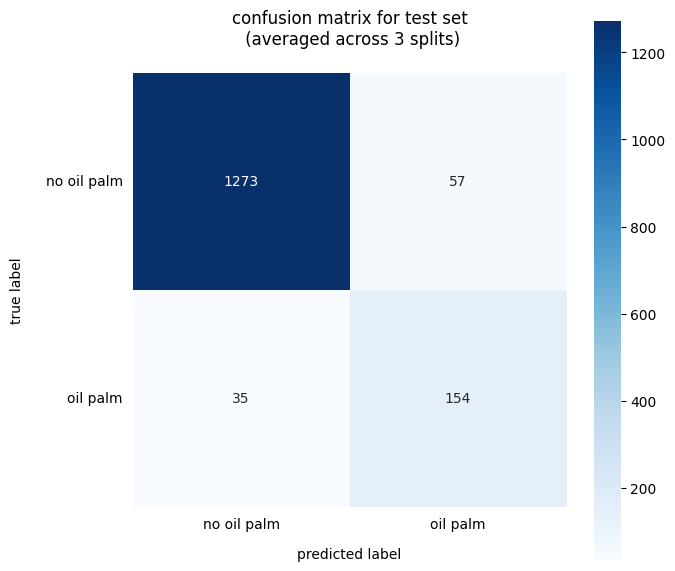

In [17]:
# create df for individual predictions & labels on test set
single_res = pd.concat(ls)[pd.concat(ls)["tta"] == "simple-augment"]
single_res = single_res[single_res.index.isin(["paths", "preds", "labels"])][["mod_paths","test_tta"]]
single_res = single_res.pivot(columns="mod_paths")

# create average confusion matrix across 3 train-val-test splits
y, paths, y_preds = single_res.apply(lambda x: list(x), axis=1)
cm = confusion_matrix(np.concatenate(y), np.concatenate(y_preds))
cm = np.round(cm/len(y))

# plotting confusion matrix
fig, ax = plt.subplots(ncols=1, figsize=(7,7))
sns.heatmap(cm, annot=True, cmap="Blues", square=True, ax=ax,  fmt='g')
ax.set_title(f"confusion matrix for test set\n (averaged across 3 splits)\n")
ax.set_xlabel('\npredicted label', labelpad=0)
ax.set_ylabel('true label\n')
ax.xaxis.set_ticklabels(["no oil palm", "oil palm"], rotation=0)
ax.yaxis.set_ticklabels(["no oil palm", "oil palm"], rotation=0)
ax.tick_params(left=False, bottom=False);

A closer look at some misclassified examples by plotting them below indicates that certain accuracy losses may also be due to incorrect labelling of the data. At the very least, to the observer without further specialist knowledge, it appears that some of the patches listed below as no oil palm actually contain oil palm plantations and that the alleged false-positive predictions of SeNet are in fact correct. Similar cases can be found for the patches designated as oil palm which actually do not appear to contain oil palm plantations.

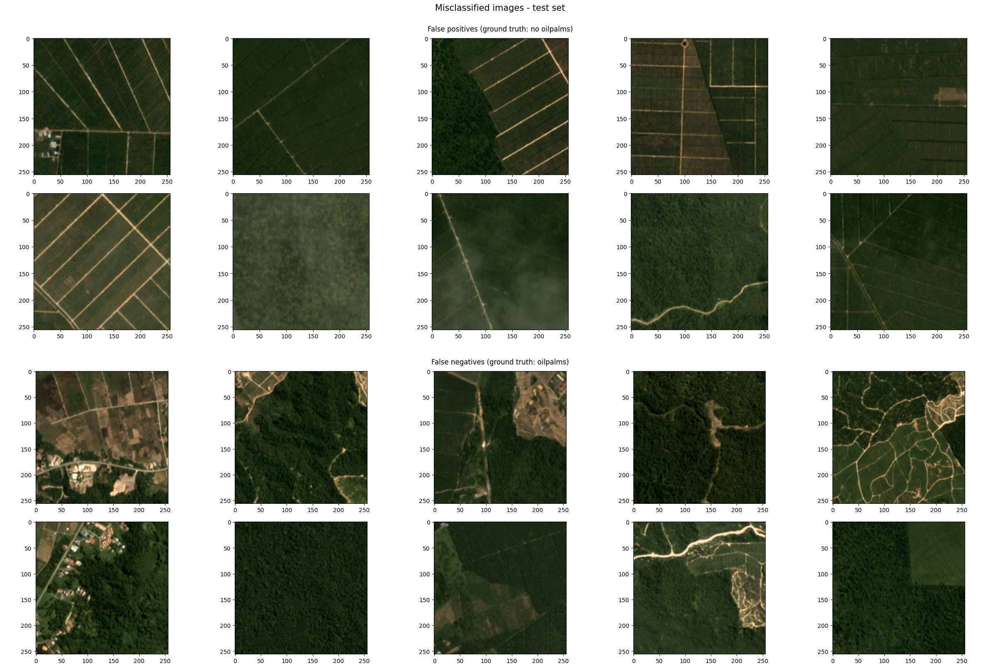

In [18]:
# explore misclassified images
single_res = pd.DataFrame({
    "labels": np.concatenate(y),
    "preds": np.concatenate(y_preds),
    }, index = np.concatenate(paths))
    
misclass_df = single_res[single_res["labels"] != single_res["preds"]]
misclass_samples = misclass_df.groupby("labels").sample(10, random_state=42)
fp_paths = misclass_samples[misclass_samples["labels"] == 0].index
fn_paths = misclass_samples[misclass_samples["labels"] == 1].index

# visualise some examples
fig, ax = plt.subplots(figsize=(24, 16), constrained_layout=True)
ax.set_axis_off()
fig.suptitle("Misclassified images - test set\n", fontsize=15)
subfigs = fig.subfigures(nrows = 2)

subfigs[0].suptitle("False positives (ground truth: no oilpalms)")
axs = subfigs[0].subplots(nrows=2, ncols=5)
for i, ax in enumerate(axs.flat):
    img = rs.open(fp_paths[i]).read()
    show(img, ax=axs.flat[i])

subfigs[1].suptitle("\nFalse negatives (ground truth: oilpalms)")
axs = subfigs[1].subplots(nrows=2, ncols=5)
for i, ax in enumerate(axs.flat):
    img = rs.open(fn_paths[i]).read()
    show(img, ax=axs.flat[i]);

Note that at this point we can only assume that the data is mislabelled. An alternative explanation is that the data are indeed correctly labelled and the differentiability based on RBG satellite images is simply not given. This implied that the classification problem is actually much more difficult than first assumed.

## Prediction for unlabelled data

To predict the labels for the unlabelled portion of the data, the three models trained with the same model configuration based on different train-val-test splits will be used to form an ensemble prediction. The majority vote decides on the predicted label. The chosen approach can be seen as a small-scale bagging approach that aims to reduce the variance of the individual models. 

In [198]:
# create a class for reading unlabelled data
class CustomImageFolder(Dataset):
    def __init__(self, target_dir: str, transform=None) -> None:
        self.img_name = [x for x in os.listdir(target_dir) if ".jpg" in x]
        self.img_paths = [os.path.join(target_dir, x) for x in self.img_name]
        self.transform = transform

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_name = self.img_name[idx]
        img_path = self.img_paths[idx]
        img = rs.open(img_path).read()
        img = torch.from_numpy(np.array(img))
        if self.transform:
            return self.transform(img), img_name
        else:
            return img, img_name

def predict(trained_mod_path):
    # read model configuration for model
    config_df = pd.read_csv(os.path.join(trained_mod_path, "model_config.csv"), header=None)
    config_dict = dict(zip(config_df.iloc[:,0], config_df.iloc[:,1]))

    # init model & transforms
    model_kwargs = {
        "model_name": config_dict["model_name"],
        "mode": config_dict["train_mode"],
        "num_classes": 1,
        "seed": int(config_dict["seed"]),
    }
    model_ft, model_transform = NN(**model_kwargs).init_model()

    # prepare data to be loaded
    img_ds = CustomImageFolder(os.path.join(data_path, "test"), model_transform)
    loader_args = {"batch_size": 64, "shuffle": False}
    img_dl = DataLoader(img_ds, **loader_args)

    # prepare model 
    device = torch.device("cuda:0") if torch.cuda.is_available() else "cpu"
    params_path = os.path.join(trained_mod_path, "model_params.pt")
    model_ft.load_state_dict(torch.load(params_path))
    model_ft = model_ft.to(device)

    # initialise best test-time augmentation transforms
    tta_transf = tta.Compose([
            tta.HorizontalFlip(),
            tta.VerticalFlip()
            ])

    # create predictions for unlabelled dataset
    mod_preds = []
    model_ft.eval()
    for imgs, img_names in img_dl:
        inputs = imgs.to(device, dtype=torch.float)
        with torch.set_grad_enabled(False):
            model_tta = tta.ClassificationTTAWrapper(model_ft, tta_transf)
            outputs = model_tta(inputs).view(-1)
            preds = torch.round(torch.sigmoid(outputs))
            preds = preds.cpu().numpy().astype("int")
            mod_preds.append(np.array((img_names, preds)).T)

    # return predictions
    return np.concatenate(mod_preds)


# predict labels using all 3 models trained on different subsets of the data  
ls = []
for mod_path in tqdm(mod_paths, desc="iterate over trained models"):
    mod_preds = predict(mod_path)
    ls.append(mod_preds)

iterate over trained models: 100%|██████████| 3/3 [07:09<00:00, 143.24s/it]


In [231]:
# summarise predictions as mean over 3 models predictions
final_preds = pd.DataFrame(np.hstack(ls)[:, [0,1,3,5]])
final_preds = final_preds.set_index([0])
final_preds = final_preds.astype("int")
final_preds = pd.DataFrame(final_preds.mean(axis=1)).round().astype("int")

# create submission file
final_preds.reset_index(names="index", inplace=True)
final_preds.columns = ['img_id', 'has_oilpalm']
final_preds.to_csv(os.path.join(res_path, "testdata.csv"), index=False)
print(f"For the test data about {final_preds['has_oilpalm'].mean():.2%} of the scenes are predicted to contain oil palm plantations.")

For the test data about 14.77% of the scenes are predicted to contain oil palm plantations.


## Summary & Conclusions

The preceding analyses have made the following relevant contributions to solving the binary classification problem of oil palms vs. no oil palms:

* In the step of EDA, existing class imbalance with a predominance of patches labelled as no oil palm was identified as an essential characteristic of the given data set. The overall accuracy of a naive classifier that constantly predicts the majority label reaches 87.6%.

* A robust, efficient RF model based on manual feature engineering achieved an overall accuracy of 92.3%. The hypothesis on the importance of structural and contextual features (i.e. mainly presence of lines and texture), which was made in the course of the EDA, was fundamental for manual feature engineering. Due to the achieved classification accuracy, which exceeds the accuracy of a naive classifier by a considerable margin, the hypothesis can be considered as confirmed. 

* To adapt a deep learning model, a wide range of NN architectures (CNNs and Vision transformer), learning rates, optimisers and loss functions were tested in a two-step hyperparameter optimisation process. The optimal configuration, maximising the overall accuracy on the validation data set, was found to be a SeNet in combination with Adam, squared hinge loss and a learning rate of 5e-5. The overall accuracy achieved was 94.0%, the corresponding F1-score 0.77. As expected, the deep learner proved to be more accurate than the RF baseline. Still, fluctuating loss curves during training and the high but not perfect accuracy indicate complications in the model fitting. The influence of possibly mislabelled data was briefly discussed as a cause.  

* Extensive analyses of uncertainty in model training via cross-validation were carried out. Multiple fitting of a model on different train, validation, test splits proved to be useful and necessary in order to make reliable statements on model performance given the limited number of images in combination with the high capacity of NNs. 

## Encountered problems & Further improvements

Among the things that have been tried but could not be realised or have not yet been tested but could usefully support the previous analyses, the following should be mentioned:

* Extensive data augmentation has not been explored yet. Probably a wider range of transforms than the one currently employed (i.e. horizontal and vertical flipping, rotations) may be able to contribute to the robustness of the models during training and avoid overfitting. To this end, I tried to make use of [deepaugment](https://github.com/barisozmen/deepaugment) - a bayesian optimisation driven data augmentation framework. Unfortunately, the repository isn't maintained anymore and the existing code is based on the outdated Tensorflow 1 version and requires Python 3.6 and Cuda 9.0. Even after successful setup of this environment, the package could not be used due to outdated dependencies to other packages.     

* For model training as well as the application of the model for prediction on the non-labelled data set, the basic assumption was made that the distribution of data and labels is similar for labelled and non-labelled data. This assumption can be considered a basic assumption for the application of machine and deep learning methods - unless there is explicit knowledge about an unrepresentative sample design. Manual inspection of some images for the unlabelled part of the data and the predictions made for them also ensured that this assumption is not completely violated in the present case. However, more comprehensive and systematic analyses could be carried out to determine whether there are minor shifts in the distributions that may need to be taken into account (-> domain adaptation).

## References

Buda, M., Maki, A., & Mazurowski, M. A. (2018). A systematic study of the class imbalance problem in convolutional neural networks. Neural Networks, 106(7), 249–259. https://doi.org/10.1016/j.neunet.2018.07.011

Cheng, G., Han, J., & Lu, X. (2017). Remote Sensing Image Scene Classification: Benchmark and State of the Art. Proceedings of the IEEE, 105(10), 1865–1883. https://doi.org/10.1109/JPROC.2017.2675998

He, H., & Garcia, E. A. (2009). Learning from Imbalanced Data. IEEE Transactions on Knowledge and Data Engineering, 21(9), 1263–1284. https://doi.org/10.1109/TKDE.2008.239

Hoffer, E., Hubara, I., & Soudry, D. (2017). Train longer, generalize better: closing the generalization gap in large batch training of neural networks. http://arxiv.org/pdf/1705.08741v2

Janocha, K., & Czarnecki, W. M. (2017). On Loss Functions for Deep Neural Networks in Classification. http://arxiv.org/pdf/1702.05659v1

Krawczyk, B. (2016). Learning from imbalanced data: open challenges and future directions. Progress in Artificial Intelligence, 5(4), 221–232. https://doi.org/10.1007/s13748-016-0094-0

Smith, L. N. (2018). A disciplined approach to neural network hyper-parameters: Part 1 -- learning rate, batch size, momentum, and weight decay. http://arxiv.org/pdf/1803.09820v2

Yang, L., & Shami, A. (2020). On Hyperparameter Optimization of Machine Learning Algorithms: Theory and Practice. Neurocomputing, 415(1), 295–316. https://doi.org/10.1016/j.neucom.2020.07.061

Yu, T., & Zhu, H. (2020). Hyper-Parameter Optimization: A Review of Algorithms and Applications. http://arxiv.org/pdf/2003.05689v1